# Instructions

As in the previous assignment, youl'll be using PyTorch instead of EDF. This assignment will focus on generative modelling, and you'll implement and train a VAE and a GAN.

It is highly suggested to use google colab and run the notebook on a GPU node.
Check https://colab.research.google.com/ and look for tutorials online on how to use it. To use a GPU go to Runtime -> Change runtime type and select GPU.

In [172]:
import torch, math, copy
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torchvision
from torchvision import datasets, transforms
import torch.nn as nn
import torch.nn.init as init
import torch.nn.functional as F
from scipy import stats
import matplotlib.pyplot as plt
from timeit import default_timer

We'll start by coding up a toy problem and seeing how a VAE and a GAN behave on it. Consider the following stochastic process:
$$ \mu_x \sim U(\{1,2,3\})$$
$$ \mu_y \sim U(\{1,2,3\})$$
$$ s \sim \mathcal N \left([\mu_x, \mu_y], \frac{1}{100}I \right)$$
where $I$ is the $2 \times 2$ identity matrix.

Implement the function in the next cell such that it returns $n$ samples distributed as $s$ from the above process. The returned object should be a $n \times 2$ PyTorch tensor.

In [171]:
def sample(n):
    mu_x = torch.randint(1, 4, (n,))
    mu_y = torch.randint(1, 4, (n,))

    cov_matrix = torch.eye(2) / 100
    multivariate_normal = torch.distributions.MultivariateNormal(
        torch.stack([mu_x.float(), mu_y.float()], dim=1),
        covariance_matrix=cov_matrix)

    s = multivariate_normal.sample()

    return s

Now we'll sample 1000 points and see how they are distributed.

In [140]:
def plot_density(data):
    data = data.numpy()
    nbins = 50
    x, y = data.T
    k = stats.gaussian_kde(data.T)
    xi, yi = np.mgrid[x.min():x.max():nbins*1j, y.min():y.max():nbins*1j]
    zi = k(np.vstack([xi.flatten(), yi.flatten()]))

    plt.pcolormesh(xi, yi, zi.reshape(xi.shape), shading='gouraud', cmap=plt.cm.BuGn_r)

    plt.tight_layout()
    plt.show()
    # plt.clf()

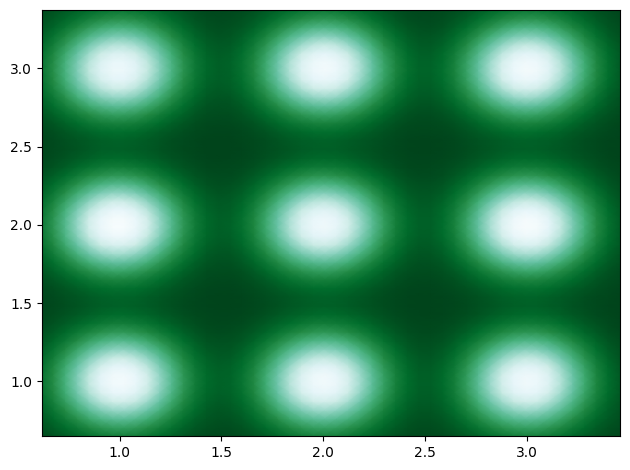

In [170]:
data = sample(10000)
plot_density(data)

## VAE on a Toy Problem

Recall that when training a VAE we're concerned with the following problem:

$$\min_{\phi} \,\ \mathbb E_{x \sim Pop, z \sim P_\phi(z|x)} \left[ \ln \frac{P_\phi(z|x)}{P(z)} - \ln P_\phi(x|z) \right] \,.$$

We'll model $P_\phi(z|x)$ with an encoder and $P_\phi(x|z)$ with a decoder as follows:
$$P_\phi(z|x) = \mathcal N \left(\mu_{\phi,z}(x), \Sigma_{\phi,z}(x) \right)$$
$$P_\phi(x|z) = \mathcal N \left( \mu_{\phi,x}(z), \sigma^2 I \right) \,,$$
where $\mu_{\phi,z}, \Sigma_{\phi,z}, \mu_{\phi,x}$ are neural networks, and $\Sigma_{\phi,z}(x)$ is diagonal.

Moreover, let $P(z)$ (the prior over $z$) to be $\mathcal N(0, I)$.


**<span style="color:blue">
    For the above distributions, what is $\ln P_\phi(x|z)$ as a function of $x, z, \mu_{\phi,x}$, and $\sigma$?
</span>**

**<span style="color:red">
    ------------------------------------------------------------------------------- ANSWER (BEGIN) -------------------------------------------------------------------------------
</span>**

This factor of the loss term, is the reconstruction loss -
Let $k$ be the number of dimensions
$$
\begin{aligned}
\mathbb E_{x \sim Pop, z \sim P_\phi(z|x)} \ln P_\phi(x|z) &= \ln \mathcal N \left( \mu_{\phi,x}(z), \sigma^2 I \right) \\
&= \ln (\frac{1}{\sqrt {{(2 \pi \sigma^2)}^k}} \exp(-\frac1{2\sigma^2} (x-\mu_{\phi,x}(z))^T (x-\mu_{\phi,x}(z))) ) \\
&= \ln (\frac{1}{\sqrt {{(2 \pi \sigma^2)}^k}}) -\frac1{2\sigma^2} (x-\mu_{\phi,x}(z))^T (x-\mu_{\phi,x}(z)) \\
&= C - \frac{(x-\mu_{\phi,x}(z))^2}{2\sigma^2}
\end{aligned}
$$

**<span style="color:red">
    ------------------------------------------------------------------------------- ANSWER (END) -------------------------------------------------------------------------------
</span>**

**<span style="color:blue">
    For the above distributions, what is $\ln \frac{P_\phi(z|x)}{P(z)}$ as a function of $x, z, \mu_{\phi,z}, \Sigma_{\phi,z}$?
</span>**

**<span style="color:red">
    ------------------------------------------------------------------------------- ANSWER (BEGIN) -------------------------------------------------------------------------------
</span>**

$E(\ln \frac{P_\phi(z|x)}{P(z)})$ is the KL divergence between the two distributions. We can rewrite it as -
$$
\begin{aligned}
K \mathcal L(P_\phi(z|x), P(z)) &= E_{P_\phi(z|x)}(\ln \frac{P_\phi(z|x)}{P(z)}) \\
&= E_{P_\phi(z|x)} \ln \frac{P_\phi(z|x)}{P(z)} \\
&= E_{P_\phi(z|x)} \ln \frac{ N( \mu_{\phi,z}(x), \Sigma_{\phi,z}(x))}{\mathcal N(0, I)} \\
&= E_{P_\phi(z|x)} \ln \frac{\frac{1}{\sqrt{2\pi} \Sigma_{\phi,z}(x)}\exp{\frac{-1}{2}\frac{(z-\mu_{\phi,z}(x))}{\Sigma_{\phi,z}(x)^2}^2}}{\frac{1}{\sqrt{2\pi}}\exp{\frac{-1}{2}z}^2} \\
&= E_{P_\phi(z|x)} \ln \frac{1}{\Sigma_{\phi,z}(x)}\exp{(\frac{-1}{2}\frac{(z-\mu_{\phi,z}(x))}{\Sigma_{\phi,z}(x)^2}^2 + \frac{z}{2}^2)} \\
&= E_{P_\phi(z|x)} \ln \frac{1}{\Sigma_{\phi,z}(x)} + {(\frac{-1}{2}\frac{(z-\mu_{\phi,z}(x))}{\Sigma_{\phi,z}(x)^2}^2 + \frac{z}{2}^2)} \\
&= \ln \frac{1}{\Sigma_{\phi,z}(x)} - \frac{1}{2} E_{P_\phi(z|x)} \frac{(z-\mu_{\phi,z}(x))}{\Sigma_{\phi,z}(x)^2}^2 + E_{P_\phi(z|x)} \frac{z}{2}^2 \\
\end{aligned}
$$

As $E_{P_\phi(z|x)} (z-\mu_{\phi,z}(x))^2 = \Sigma_{\phi,z}(x)^2$ and $\Sigma_{\phi,z}(x)^2 = E_{P_\phi(z|x)} (z)^2 - (E_{P_\phi(z|x)} (z))^2 $

$$
\begin{aligned}
&= \ln \frac{1}{\Sigma_{\phi,z}(x)} - \frac{1}{2} +  \frac{\Sigma_{\phi,z}(x)^2 + (E_{P_\phi(z|x)} (z))^2}{2} \\
&= \frac{1}{2}{(\ln \frac{1}{{\Sigma_{\phi,z}(x)}^2} - 1 + \Sigma_{\phi,z}(x)^2 + (\mu_{\phi,z}(x))^2)} \\
\end{aligned}
$$


**<span style="color:red">
    ------------------------------------------------------------------------------- ANSWER (END) -------------------------------------------------------------------------------
</span>**

We are almost ready to set up a VAE network in PyTorch and train it. The following cell has an incomplete implementation of a VAE. The encoder and decoder networks are already defined (note that the encoder outputs $\log \Sigma$ instead of $\Sigma$, which is standard practice since otherwise we have to guarantee that the covariance matrix is non-negative). latent_dim is the dimensionality of the latent variable $z$.

Complete the implementations of encode, sample, and decode.
The encode method receives samples $x$ and has to return the mean vector $\mu_z(x)$ and the element-wise log of the diagonal of $\Sigma_z(x)$. The self.encoder network already maps $x$ to a 50-dim vector, and the self.mu, self.logvar modules can be used to map this 50-dim vector to the mean vector and the log diag of the covariance matrix.

The sample method receives mu and logvar (the outputs of encode) and has to return samples from the corresponding Gaussian distribution. Here we typically employ the reparameterization trick, where we can draw a sample $s \sim \mathcal N(\mu, \sigma)$ by doing $s = \mu + \sigma \cdot \epsilon, \epsilon \sim \mathcal N(0, 1)$, which yields well-defined gradients that autograd takes care of computing. Like in the original VAE paper, sample a single $s$ for each input.

Finally, the decode method takes $z$ as input and should return $\mu_x(z)$. You should use the self.decodet module for this.

In [80]:
class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        self.latent_dim = latent_dim

        self.encoder = nn.Sequential(
            nn.Linear(2, 50),
            nn.ReLU(),
            nn.Linear(50, 50),
            nn.ReLU()
        )

        self.mu = nn.Linear(50, latent_dim)
        self.logvar = nn.Linear(50, latent_dim)

        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 50),
            nn.ReLU(),
            nn.Linear(50, 50),
            nn.ReLU(),
            nn.Linear(50, 2)
        )

    def encode(self, x):
        mu_logvar_inter = self.encoder(x)
        mu = self.mu(mu_logvar_inter)
        logvar = self.logvar(mu_logvar_inter)
        return mu, logvar

    def sample(self, mu, logvar):
        epsilon = torch.randn(mu.shape).cuda()
        sd = torch.exp(0.5*logvar)
        z = mu + sd*epsilon
        return z

    def decode(self, z):
        out = self.decoder(z)
        return out

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.sample(mu, logvar)
        out = self.decode(z)
        return mu, logvar, out

    def generate(self, n):
        z = torch.randn(n, self.latent_dim).cuda()
        samples = self.decode(z)
        return samples

Note that the previous VAE objective can be written as

$$\min_{\phi} \,\ \mathbb E_{x \sim Pop} \left[ D_{KL}(P_\phi(z|x) || P(z)) + \mathbb E_{z \sim P_\phi(z|x)} \left[ -\ln P_\phi(x|z) \right] \right] \,$$

The first term requires computation of KL divergence between two multivariate Gaussian distributions, which has a closed form solution. The second term requires sampling noise. As in the case of the original VAE paper, sample a single $z$ for every $x$ in the forward pass in order to compute this second quantity.

Now, implement the loss of the VAE by deriving the closed-form expression for the KL divergence as well as using the expression for $\ln P_\phi(x|z)$ you derived previously. The recon_loss term should have the factor corresponding to $P_\phi(x|z)$, while kld_loss should have the KL divergence term.

In your derivation $\sigma$ hopefully showed up as a weight between the two terms. Here we'll use the standard beta-VAE notation and apply a weight beta on the KL divergence term instead.

In [175]:
def loss(x, out, mu, logvar, beta):
    recons_loss = torch.sum((x - out)**2)
    kld_loss = 0.5 * torch.sum(-logvar - 1 + logvar.exp() + mu.pow(2))
    loss = recons_loss + beta * kld_loss
    return recons_loss, kld_loss, loss

We can then train the VAE on the toy problem and see how it performs.
Try different values of beta until you find one that yields good results.

In [176]:
vae = VAE(100).cuda()
opt = torch.optim.Adam(vae.parameters(), lr=5e-4)

tensor(1192.4521, device='cuda:0', grad_fn=<SumBackward0>) tensor(414.0346, device='cuda:0', grad_fn=<MulBackward0>) tensor(1213.1539, device='cuda:0', grad_fn=<AddBackward0>)


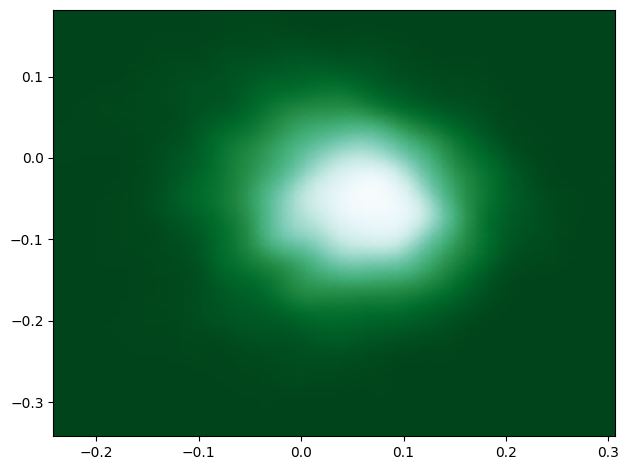

tensor(25.0467, device='cuda:0', grad_fn=<SumBackward0>) tensor(597.4741, device='cuda:0', grad_fn=<MulBackward0>) tensor(54.9205, device='cuda:0', grad_fn=<AddBackward0>)


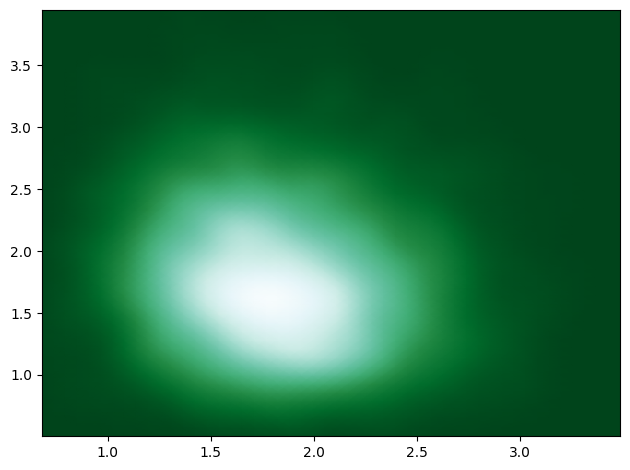

tensor(9.0931, device='cuda:0', grad_fn=<SumBackward0>) tensor(426.2803, device='cuda:0', grad_fn=<MulBackward0>) tensor(30.4071, device='cuda:0', grad_fn=<AddBackward0>)


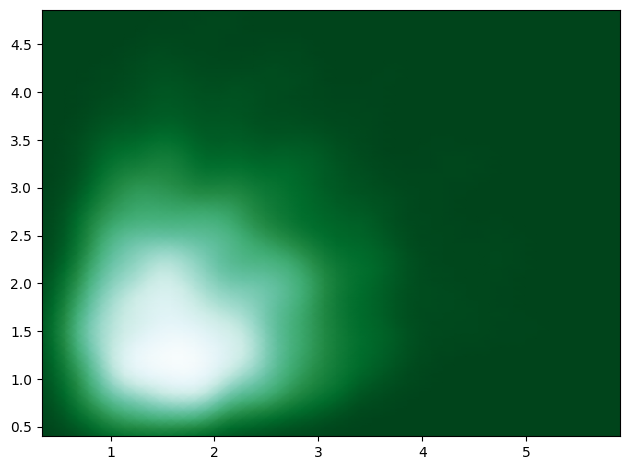

tensor(7.5551, device='cuda:0', grad_fn=<SumBackward0>) tensor(413.2493, device='cuda:0', grad_fn=<MulBackward0>) tensor(28.2175, device='cuda:0', grad_fn=<AddBackward0>)


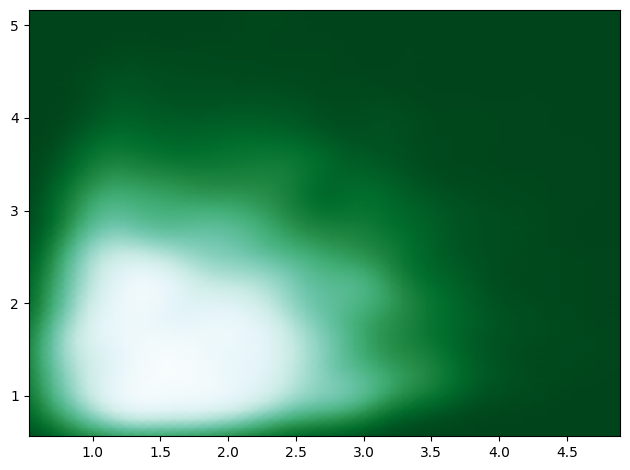

tensor(6.6202, device='cuda:0', grad_fn=<SumBackward0>) tensor(404.1680, device='cuda:0', grad_fn=<MulBackward0>) tensor(26.8286, device='cuda:0', grad_fn=<AddBackward0>)


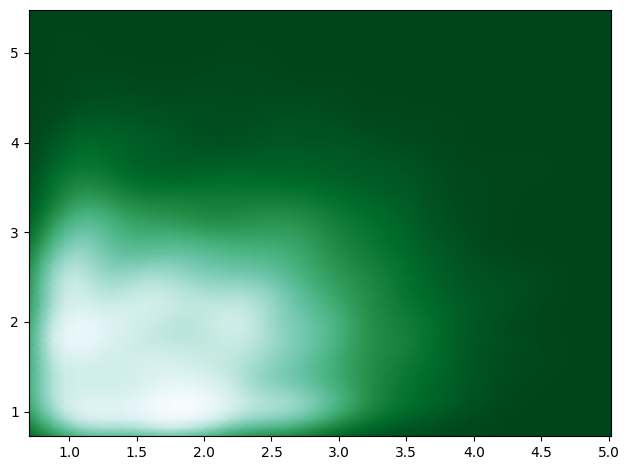

tensor(5.9522, device='cuda:0', grad_fn=<SumBackward0>) tensor(397.3218, device='cuda:0', grad_fn=<MulBackward0>) tensor(25.8183, device='cuda:0', grad_fn=<AddBackward0>)


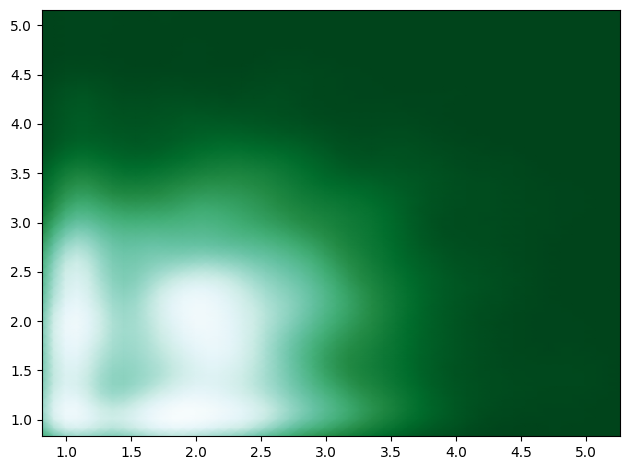

tensor(6.9180, device='cuda:0', grad_fn=<SumBackward0>) tensor(395.2266, device='cuda:0', grad_fn=<MulBackward0>) tensor(26.6793, device='cuda:0', grad_fn=<AddBackward0>)


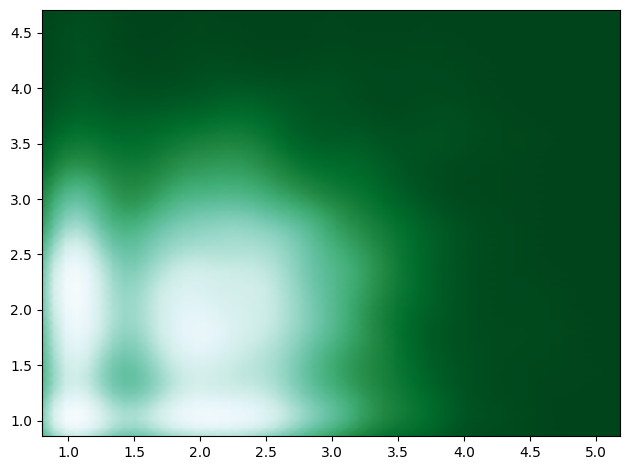

tensor(4.9595, device='cuda:0', grad_fn=<SumBackward0>) tensor(402.3625, device='cuda:0', grad_fn=<MulBackward0>) tensor(25.0776, device='cuda:0', grad_fn=<AddBackward0>)


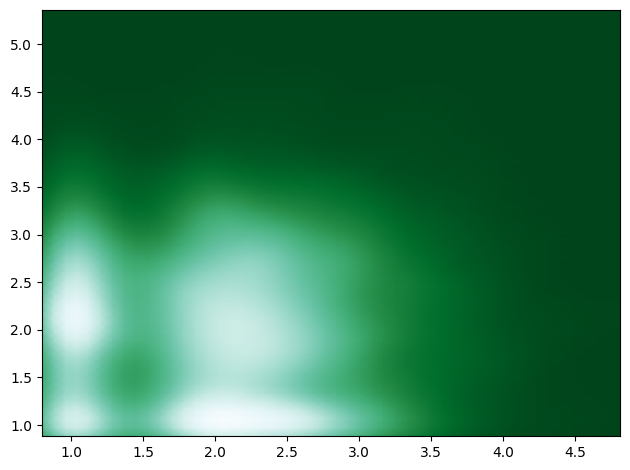

tensor(5.3343, device='cuda:0', grad_fn=<SumBackward0>) tensor(397.5578, device='cuda:0', grad_fn=<MulBackward0>) tensor(25.2121, device='cuda:0', grad_fn=<AddBackward0>)


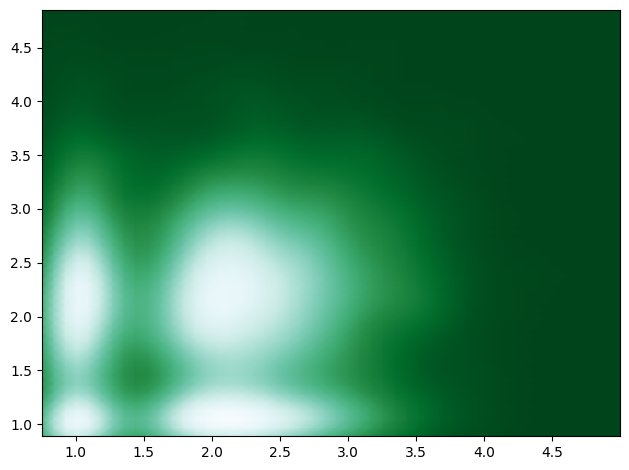

tensor(4.4363, device='cuda:0', grad_fn=<SumBackward0>) tensor(388.3570, device='cuda:0', grad_fn=<MulBackward0>) tensor(23.8541, device='cuda:0', grad_fn=<AddBackward0>)


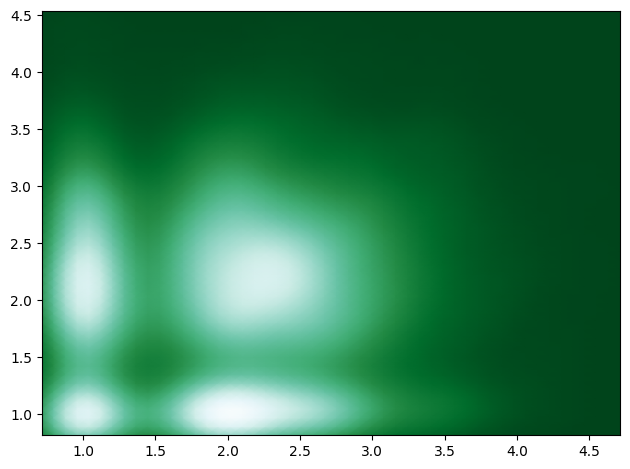

tensor(5.8949, device='cuda:0', grad_fn=<SumBackward0>) tensor(392.9106, device='cuda:0', grad_fn=<MulBackward0>) tensor(25.5405, device='cuda:0', grad_fn=<AddBackward0>)


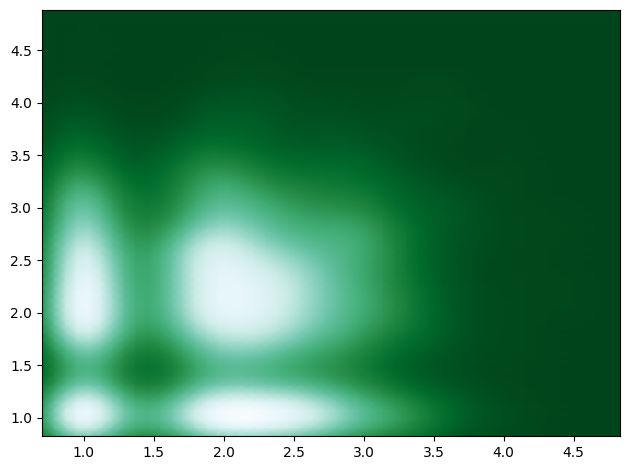

tensor(4.2786, device='cuda:0', grad_fn=<SumBackward0>) tensor(379.1552, device='cuda:0', grad_fn=<MulBackward0>) tensor(23.2363, device='cuda:0', grad_fn=<AddBackward0>)


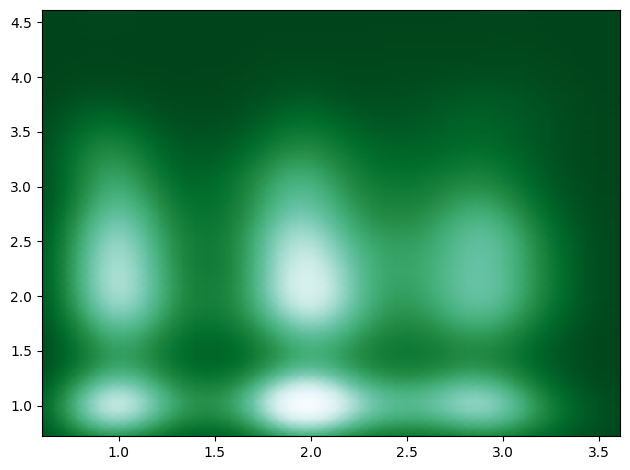

tensor(4.2009, device='cuda:0', grad_fn=<SumBackward0>) tensor(378.9995, device='cuda:0', grad_fn=<MulBackward0>) tensor(23.1508, device='cuda:0', grad_fn=<AddBackward0>)


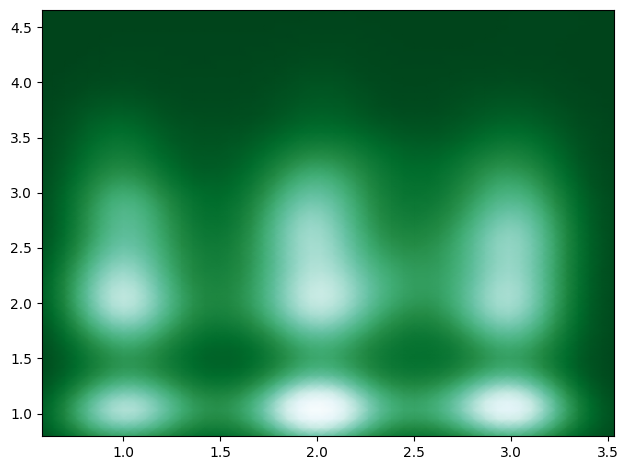

tensor(3.7160, device='cuda:0', grad_fn=<SumBackward0>) tensor(358.4859, device='cuda:0', grad_fn=<MulBackward0>) tensor(21.6403, device='cuda:0', grad_fn=<AddBackward0>)


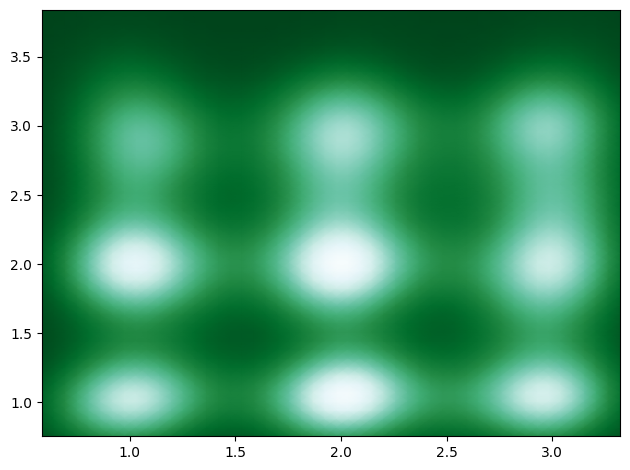

tensor(4.2879, device='cuda:0', grad_fn=<SumBackward0>) tensor(367.5842, device='cuda:0', grad_fn=<MulBackward0>) tensor(22.6672, device='cuda:0', grad_fn=<AddBackward0>)


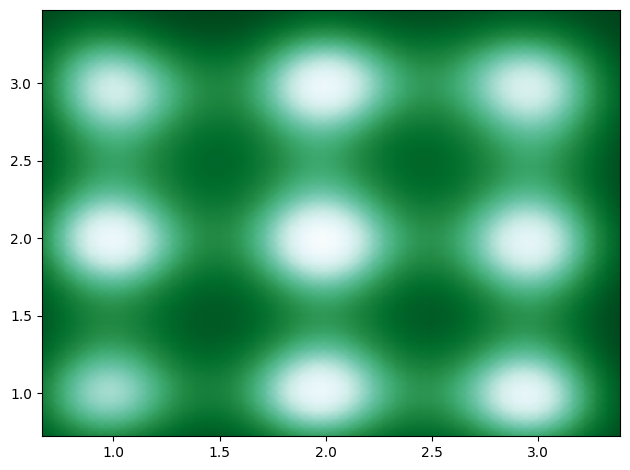

tensor(5.2103, device='cuda:0', grad_fn=<SumBackward0>) tensor(358.8646, device='cuda:0', grad_fn=<MulBackward0>) tensor(23.1536, device='cuda:0', grad_fn=<AddBackward0>)


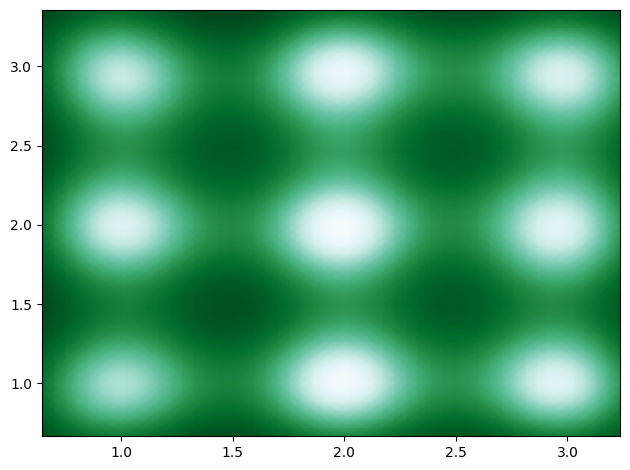

tensor(4.6290, device='cuda:0', grad_fn=<SumBackward0>) tensor(365.0252, device='cuda:0', grad_fn=<MulBackward0>) tensor(22.8803, device='cuda:0', grad_fn=<AddBackward0>)


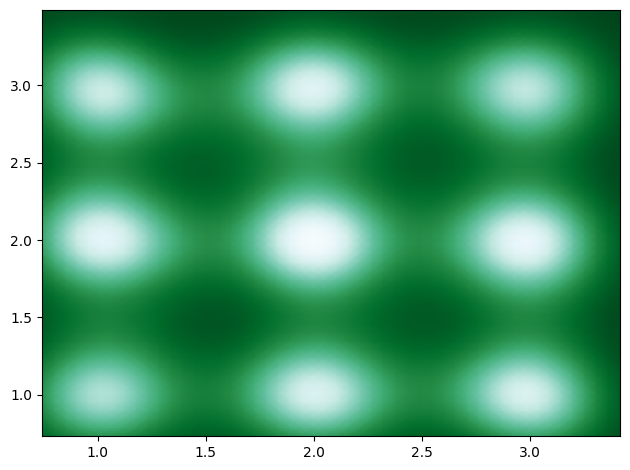

tensor(3.6291, device='cuda:0', grad_fn=<SumBackward0>) tensor(355.1477, device='cuda:0', grad_fn=<MulBackward0>) tensor(21.3865, device='cuda:0', grad_fn=<AddBackward0>)


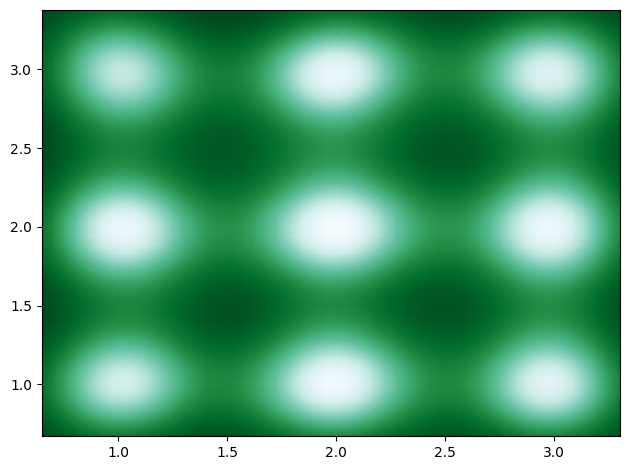

tensor(3.2161, device='cuda:0', grad_fn=<SumBackward0>) tensor(341.6944, device='cuda:0', grad_fn=<MulBackward0>) tensor(20.3008, device='cuda:0', grad_fn=<AddBackward0>)


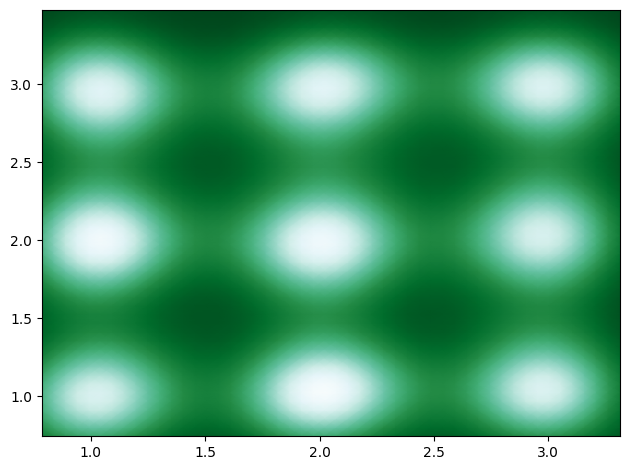

tensor(3.7746, device='cuda:0', grad_fn=<SumBackward0>) tensor(353.6493, device='cuda:0', grad_fn=<MulBackward0>) tensor(21.4571, device='cuda:0', grad_fn=<AddBackward0>)


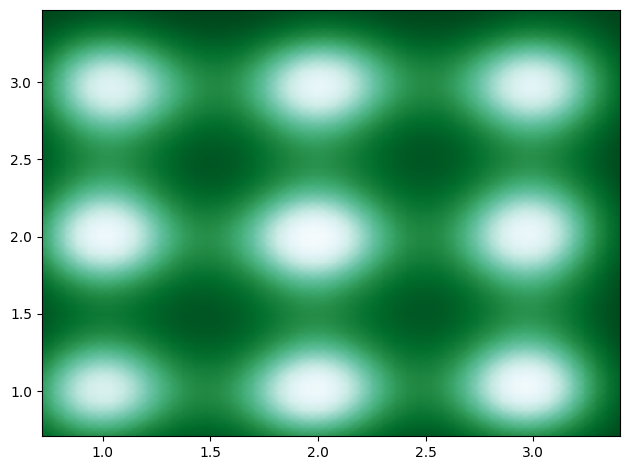

tensor(3.5729, device='cuda:0', grad_fn=<SumBackward0>) tensor(358.1360, device='cuda:0', grad_fn=<MulBackward0>) tensor(21.4797, device='cuda:0', grad_fn=<AddBackward0>)


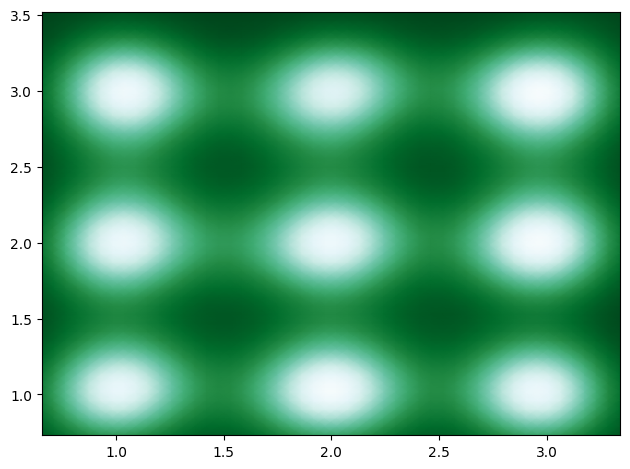

In [ ]:
beta = 0.05
for i in range(20001):
    s = sample(128).cuda()
    mu, logvar, out = vae(s)
    rl, kl, l = loss(s, out, mu, logvar, beta)
    opt.zero_grad()
    l.backward()
    opt.step()
    if not i % 1000:
        print(rl, kl, l)
        data = vae.generate(5000)
        plot_density(data.cpu().data)

**<span style="color:blue">
    How does beta affect the performance of the VAE? Show or discuss what tradeoff beta controls, and how this can be observed from the above plots and/or any additional plots.
</span>**

**<span style="color:red">
    ------------------------------------------------------------------------------- ANSWER (BEGIN) -------------------------------------------------------------------------------
</span>**

The $\beta$ value controls the trade-off between the reconstruction loss, and the KL divergence. Having a low $\beta$ prioritises the reconstruction loss, while a high $\beta$ prioritises the KL divergence.

Prioritising the reconstruction loss means we end up trying to ensure that we get more values that are part of the real distribution. We end up looking at the right values, but we fail to penalise the wrong matching enough. This can lead to fuzzy looking images in our case.

Prioritising the KL divergence means that we end severely penalising any wrong values. This means that we will get the "right" outputs, but maybe only a subset of them. As we see below, in our exploration of $\beta$, this leads to a very narrow definition of what ends up being accepted (only values around (2,2) ignoring the other circles).

0.01
tensor(1.4311, device='cuda:0', grad_fn=<SumBackward0>) tensor(523.4210, device='cuda:0', grad_fn=<MulBackward0>) tensor(6.6653, device='cuda:0', grad_fn=<AddBackward0>)


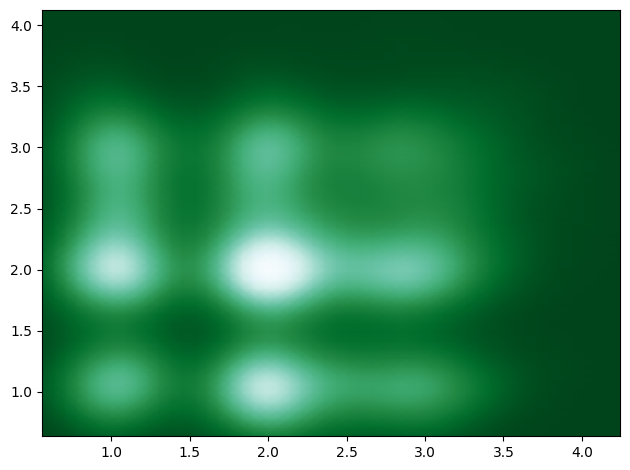

0.05
tensor(3.9778, device='cuda:0', grad_fn=<SumBackward0>) tensor(354.4502, device='cuda:0', grad_fn=<MulBackward0>) tensor(21.7003, device='cuda:0', grad_fn=<AddBackward0>)


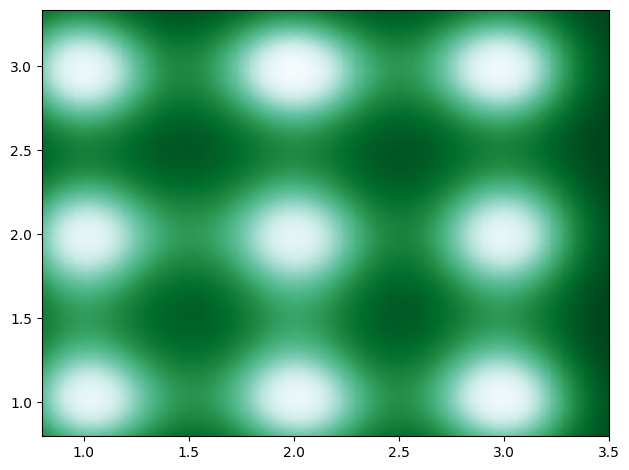

0.1
tensor(10.0945, device='cuda:0', grad_fn=<SumBackward0>) tensor(312.8720, device='cuda:0', grad_fn=<MulBackward0>) tensor(41.3817, device='cuda:0', grad_fn=<AddBackward0>)


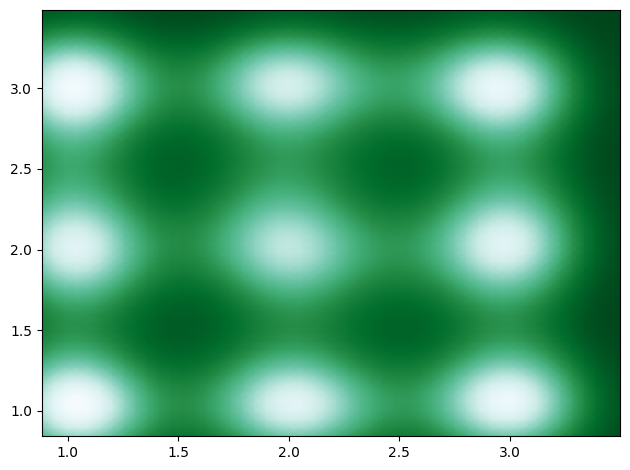

0.5
tensor(52.0592, device='cuda:0', grad_fn=<SumBackward0>) tensor(135.6163, device='cuda:0', grad_fn=<MulBackward0>) tensor(119.8673, device='cuda:0', grad_fn=<AddBackward0>)


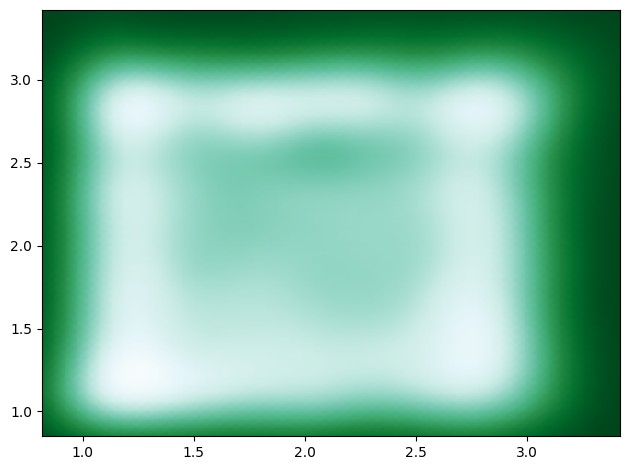

1
tensor(141.6796, device='cuda:0', grad_fn=<SumBackward0>) tensor(22.2462, device='cuda:0', grad_fn=<MulBackward0>) tensor(163.9258, device='cuda:0', grad_fn=<AddBackward0>)


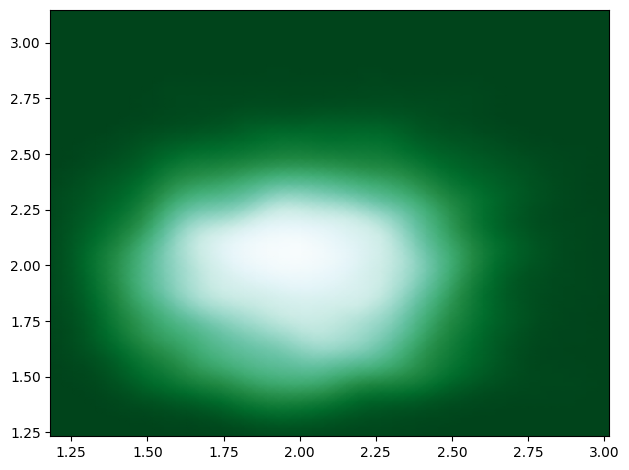

5
tensor(184.5462, device='cuda:0', grad_fn=<SumBackward0>) tensor(0.0021, device='cuda:0', grad_fn=<MulBackward0>) tensor(184.5565, device='cuda:0', grad_fn=<AddBackward0>)


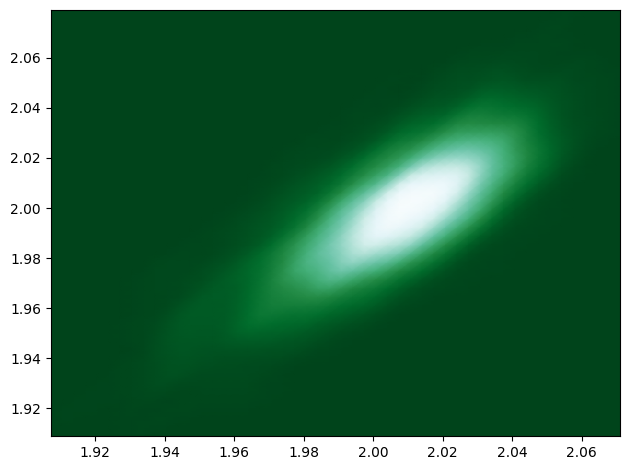

In [ ]:
betas = [0.01, 0.05, 0.1, 0.5, 1, 5]
for beta in betas:
  print(beta)
  vae = VAE(100).cuda()
  opt = torch.optim.Adam(vae.parameters(), lr=5e-4)
  for i in range(20001):
      s = sample(128).cuda()
      mu, logvar, out = vae(s)
      rl, kl, l = loss(s, out, mu, logvar, beta)
      opt.zero_grad()
      l.backward()
      opt.step()
      if i == 20000:
          print(rl, kl, l)
          data = vae.generate(5000)
          plot_density(data.cpu().data)

**<span style="color:red">
    ------------------------------------------------------------------------------- ANSWER (END) -------------------------------------------------------------------------------
</span>**

## GAN

Recall the GAN objective
$$\min_\psi \max_\phi \,\ \mathbb E_{x \sim Pop}[ -\ln P_\psi(1 | x) ] + \mathbb E_{z \sim \mathcal N(0,1)} [- \ln P_\psi(0|G_\phi(z))  ] \,,$$
where $G_\phi$ is a network that maps gaussian noise $z \sim \mathcal N(0,1)$ to $G(z)$ with the same shape as $x$, and $P_\psi$ is modeled by another network (the discriminator) that maps real samples $x$ and 'fake' samples $G(z)$ to a distribution over $\{0,1\}$.

We will follow the common practice of adopting a different objective for the generator network $G$:
$$\min_\phi \,\ \mathbb E_{z \sim \mathcal N(0,1)} [- \ln P_\psi(1|G_\phi(z))  ] \,.$$

First, complete the implementation of the Generator module below. The forward method takes an integer $n$ as input and should return $n$ samples $G(z), z \sim \mathcal N(0, I)$, each with dimensionality 2. You should use the self.network module for the mapping $G$.

In [126]:
class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        self.latent_dim = latent_dim

        self.network = nn.Sequential(
            nn.Linear(latent_dim, 50),
            nn.ReLU(),
            nn.Linear(50, 50),
            nn.ReLU(),
            nn.Linear(50, 2)
        )

    def decode(self, input):
        out = self.network(input)
        return out

    def forward(self, n):
        z = torch.randn(n, self.latent_dim).cuda()
        samples = self.decode(z)
        return samples

In [127]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.network = nn.Sequential(
            nn.Linear(2, 50),
            nn.ReLU(),
            nn.Linear(50, 50),
            nn.ReLU(),
            nn.Linear(50, 1)
        )

    def forward(self, input):
        out = self.network(input)
        return out

In [128]:
generator = Generator(100).cuda()
gopt = torch.optim.Adam(generator.parameters(), lr=5e-4, betas=(0.5, 0.999))
discriminator = Discriminator().cuda()
dopt = torch.optim.Adam(discriminator.parameters(), lr=5e-4, betas=(0.5, 0.999))
criterion = torch.nn.BCEWithLogitsLoss().cuda()

Now, you'll implement the training procedure for GANs. In each iteration of the for loop below we'll update the parameters of the generator and then update the discriminator.

Fill up the missing code below. You should rely on the objective given previously to define the loss of the generator and the discriminator (both the function, the data inputs, and the target labels).

tensor(0.7090, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.6466, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(0.7715, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


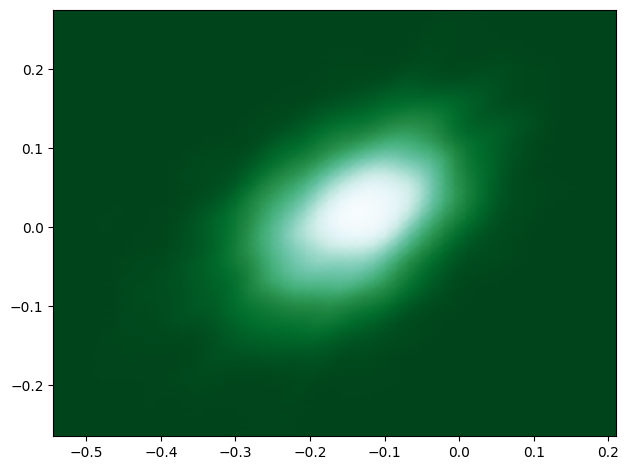

tensor(0.8221, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.3035, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3406, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


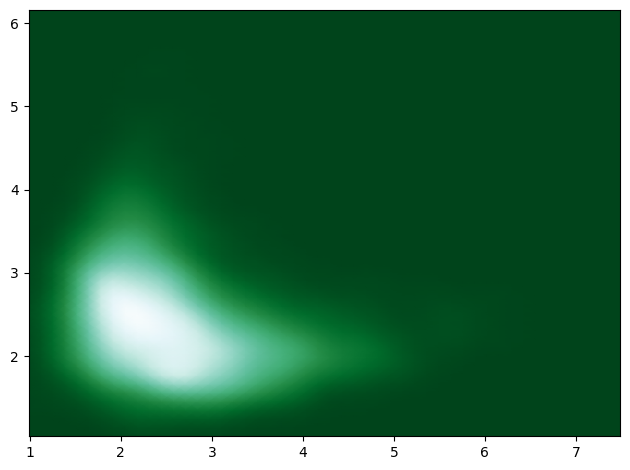

tensor(0.8349, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2720, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3978, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


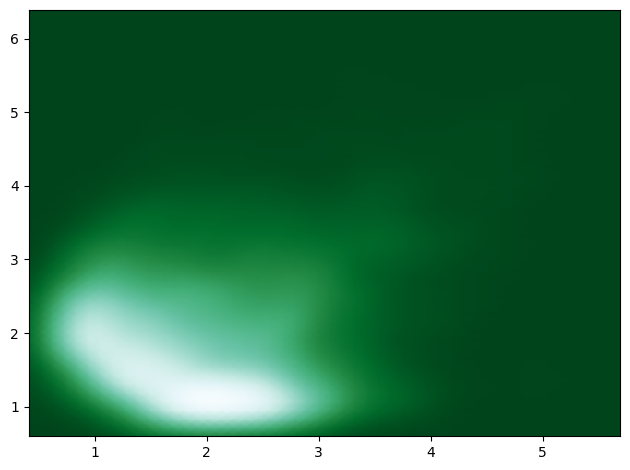

tensor(0.8246, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2898, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3593, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


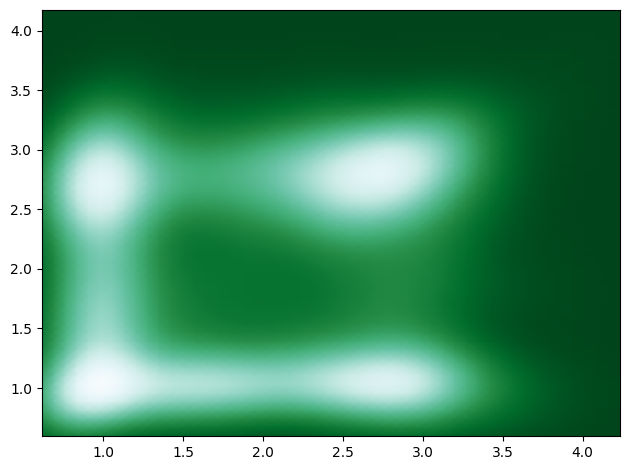

tensor(0.8325, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2846, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3804, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


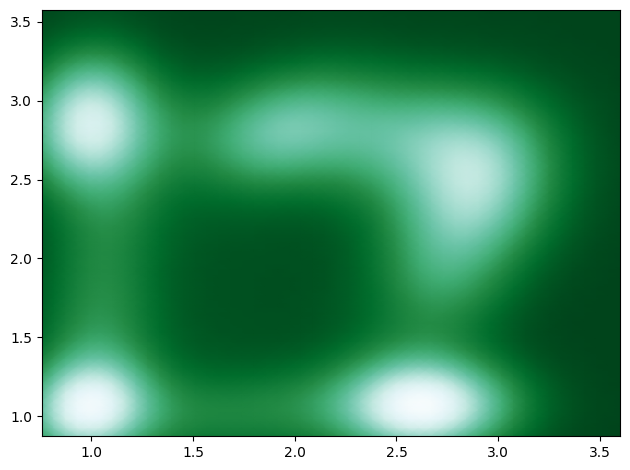

tensor(0.8311, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2860, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3761, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


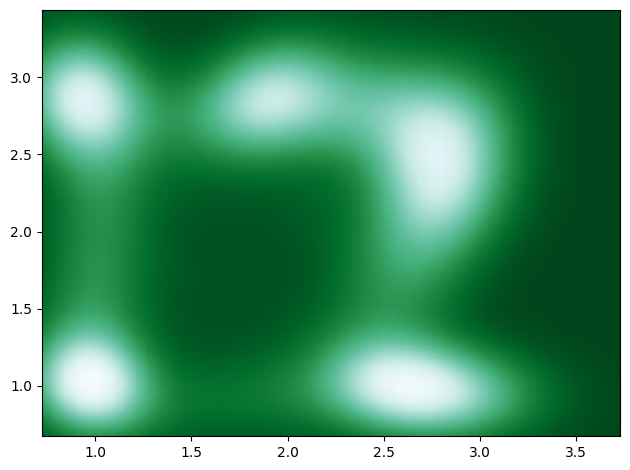

tensor(0.8361, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2723, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3998, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


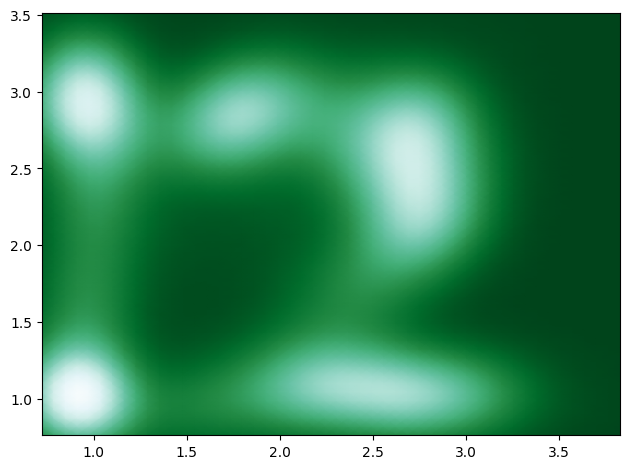

tensor(0.8361, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2634, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4088, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


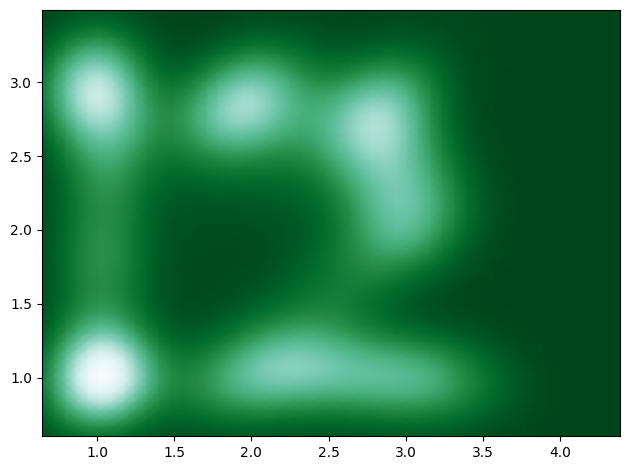

tensor(0.8331, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2640, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4023, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


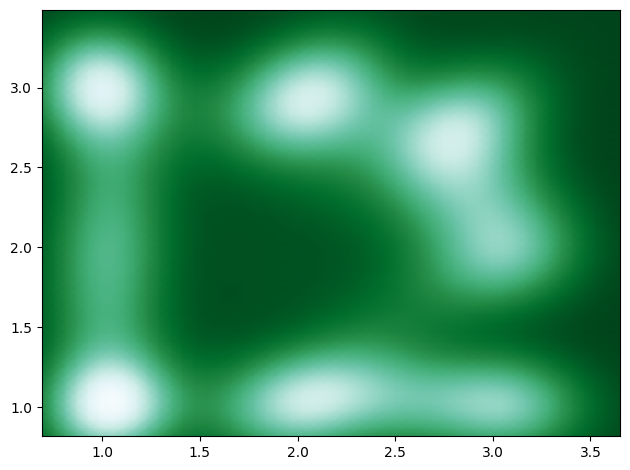

tensor(0.8079, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2836, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3323, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


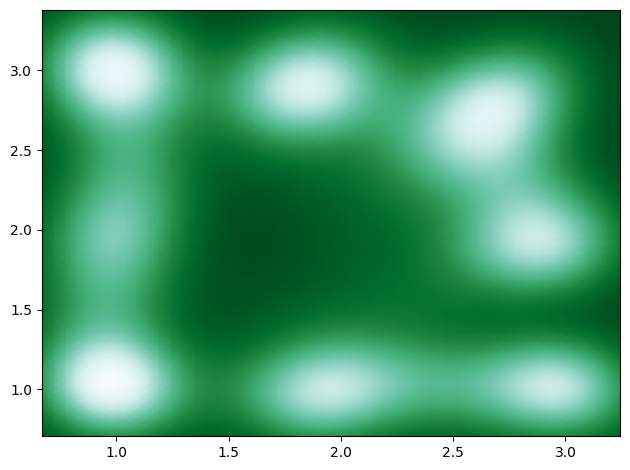

tensor(0.8156, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2823, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3488, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


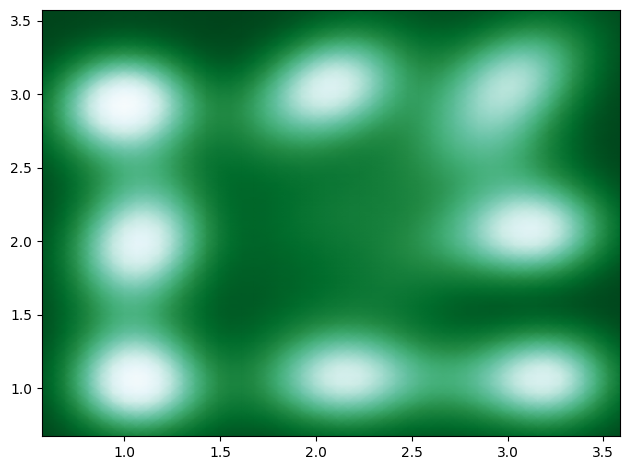

tensor(0.8174, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2890, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3458, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


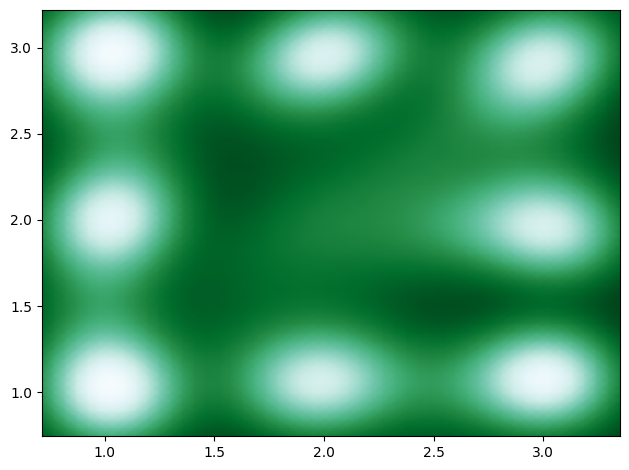

tensor(0.8370, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2737, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4003, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


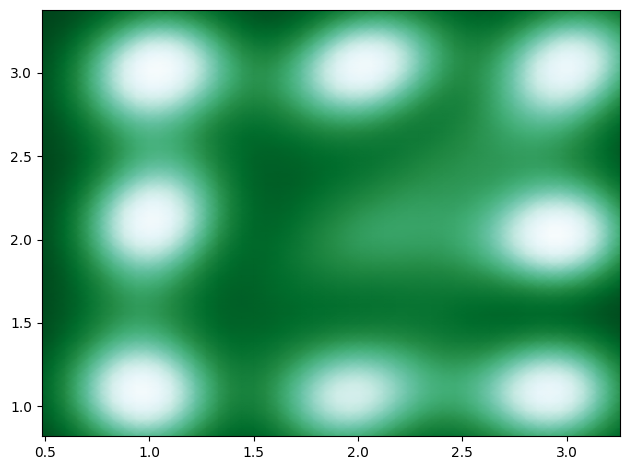

tensor(0.8286, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2856, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3716, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


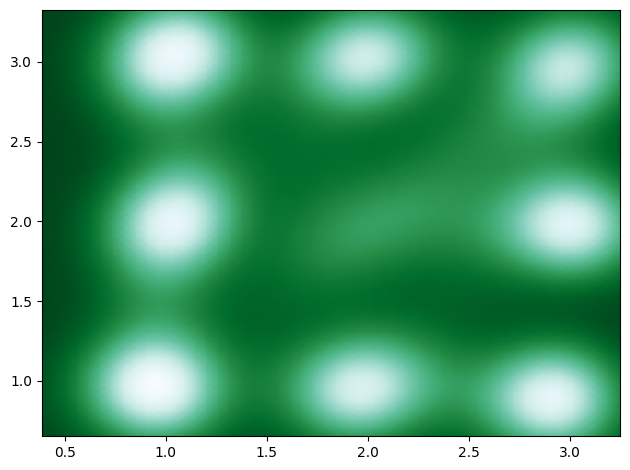

tensor(0.8445, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2676, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4214, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


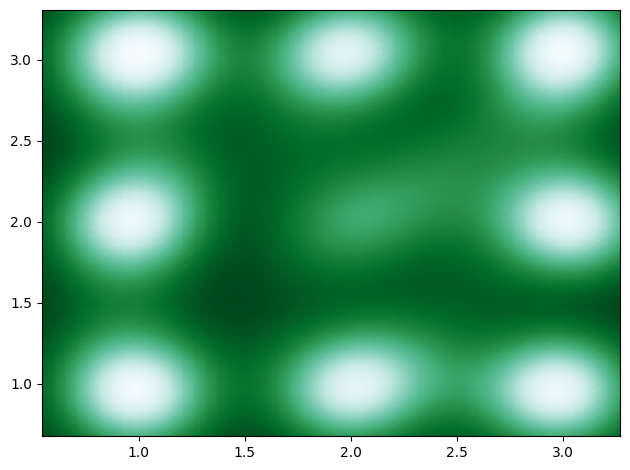

tensor(0.8412, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2687, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4136, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


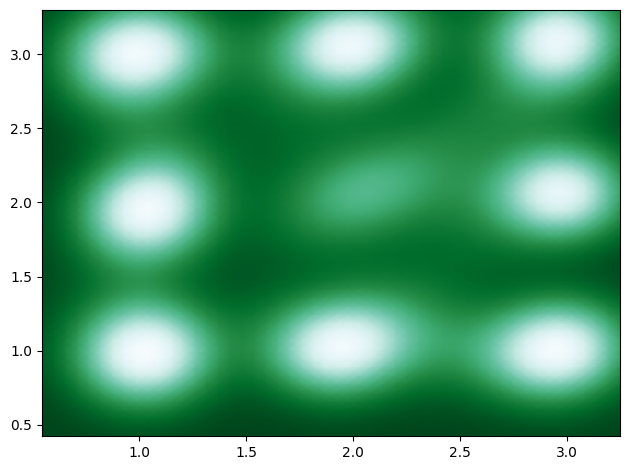

tensor(0.8178, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2881, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3474, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


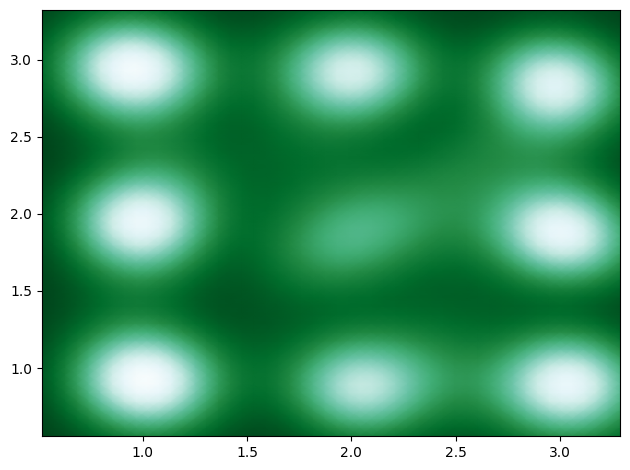

tensor(0.8283, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2884, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3683, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


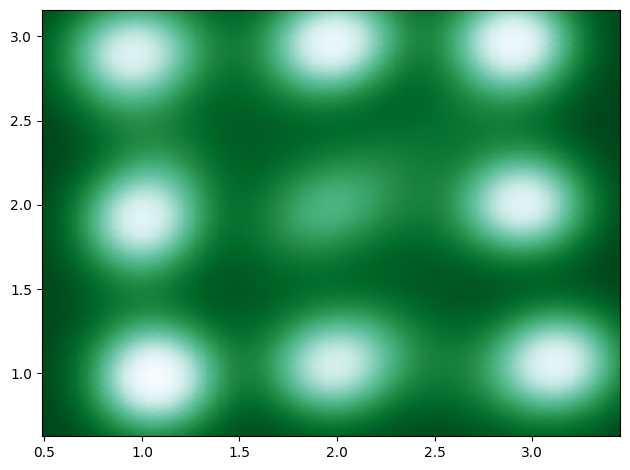

tensor(0.8221, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2789, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3654, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


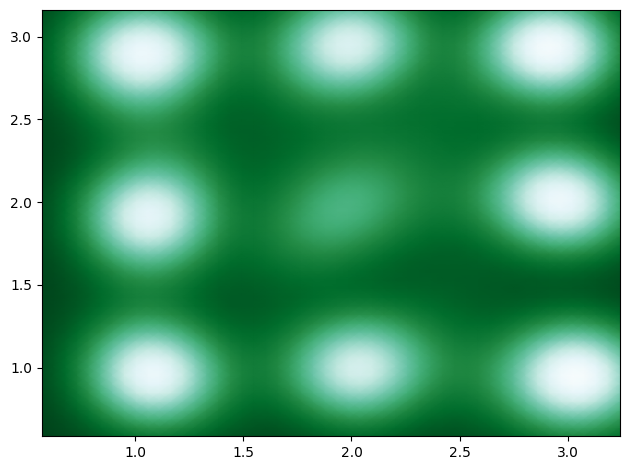

tensor(0.8314, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2836, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.3792, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


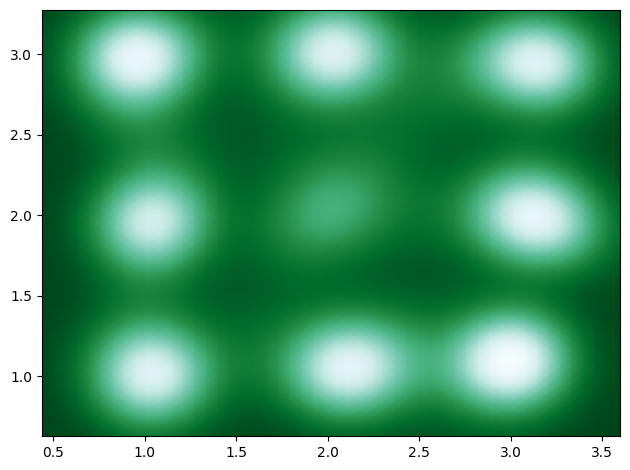

tensor(0.8375, device='cuda:0', grad_fn=<DivBackward0>) tensor(0.2728, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>) tensor(1.4021, device='cuda:0',
       grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)


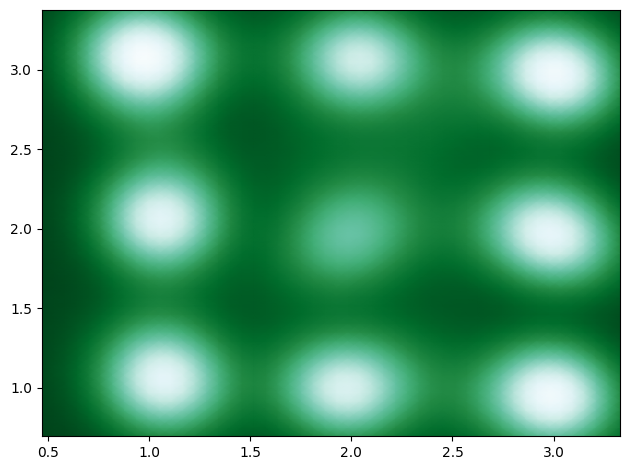

In [129]:
batch_size = 128
for i in range(20001):
    real_data = sample(batch_size).cuda()

    gopt.zero_grad()
    dopt.zero_grad()

    fake_data = generator(batch_size)
    gloss = criterion(discriminator(fake_data), torch.ones(batch_size, 1).cuda())
    gloss.backward()
    gopt.step()

    dloss_real = criterion(discriminator(real_data), torch.ones(batch_size, 1).cuda())
    dloss_fake = criterion(discriminator(fake_data.detach()), torch.zeros(batch_size, 1).cuda())
    dloss = (dloss_real + dloss_fake)/2

    dloss.backward()
    dopt.step()

    if i % 1000 == 0:
        data = generator(5000)
        plot_density(data.cpu().data)

**<span style="color:blue">
    Compare and discuss the results you obtained with the VAE and with the GAN approach.
</span>**

**<span style="color:red">
    ------------------------------------------------------------------------------- ANSWER (BEGIN) -------------------------------------------------------------------------------
</span>**

The GAN also converges but will require more samples/time than the VAE. Comparing the two, since in GANs the only feedback to the generator is good vs bad, it takes a very different approach to arrive at the representation. It first explores more of the output space and then starts shaping that output. It's approach looks a lot blobbier than that of the VAE. With the ouput mass moving and slowly separating.

Through my experimenting with both, given the same batch sizes, for each run, the VAE converges faster, in about half to three-fourths of the time.

The VAE has the added benefit of having a tunable hyperparameter, $\beta$, which allows to choose what is important in our representation and proceed accordingly, whereas a GAN is sort of harder to finetune. In the GAN above, we can also see it settling down for something that works reasonably well, and then stagnate. The masses are not as well lined up as in the VAE (the first column sort of tilts to the left, and the circle around (2,2) seems to not be able to separate fully given the current run scenario; it does converge if we increase the sample size/runs!)

A GAN also relies on good training of two separate models, and sort of goes for what "looks right", as opposed to a finer understanding of inner representation. It still performs decently!


**<span style="color:red">
    ------------------------------------------------------------------------------- ANSWER (END) -------------------------------------------------------------------------------
</span>**

## VAE and GANs on CelebA/MNIST

In this second part of the assignment you'll train a VAE and a GAN on a more interesting dataset. The cell below will try to download and load CelebA, and will just load MNIST in case there is an error.

It is likely that you'll get an error when trying to download CelebA since the its google drive is always out of quota. If you'd like to use CelebA anyway, you can try to download it from here http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html or some other source. If you're not running this notebook on a GPU then use MNIST instead.

In [83]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Resize(64), transforms.CenterCrop(64), transforms.Normalize((0.5,), (0.5,))])
# try:
#     dataset = datasets.CelebA("data", split='all', download=True, transform=transform)
#     print("here!")
# except:
dataset = datasets.MNIST("data", train=True, download=True, transform=transform)
loader = torch.utils.data.DataLoader(dataset, batch_size=256, shuffle=True)

We'll use a a CNN for the VAE instead of the simple model we defined previously.
Implement a network following these specifications:

- Encoder. Should have 4 conv layers, each with kernel size 4, stride 2 and padding 1, which decrease the spatial resolution by half. The output of the 4th conv (a spatial res. 4x4) should be flattened and then fully connected layers should be used to compute mu and logvar. Add whichever activation function you prefer between the conv layers (ReLU, LeakyReLU, ELU, etc), and feel free to add batch norm as well. Let the first conv layer have, say, 8 or 16 channels and then double the number of channels at each following conv layer.

- Decoder. Try to have an architecture that is roughly symmetric to the encoder. For example, start with a fully connected layer to project the latent_dim dimensional input such that you end up wuth a (128\*4\*4)-dimensional vector that you can reshape into a 4x4 image. Then you can apply 4 transposed conv layers, e.g. with kernel size 4, stride 2 and padding 1, to double the spatial resolution with each layer, having a final output of size 64x64. Start with around 64 or 128 channels for the first transposed conv and then halve the number of channels at each following conv layer. As before, add your preferred activation function between layers, with or without batch norm.

The encode, sample, and decode methods have the same specification as before.

In [84]:
class ConvVAE(nn.Module):
    def __init__(self, latent_dim):
        super(ConvVAE, self).__init__()
        self.latent_dim = latent_dim

        self.encoder = nn.Sequential(
            nn.Conv2d(1,16,4,2,1),
            nn.BatchNorm2d(16),
            nn.ELU(),
            nn.Conv2d(16,32,4,2,1),
            nn.BatchNorm2d(32),
            nn.ELU(),
            nn.Conv2d(32,64,4,2,1),
            nn.BatchNorm2d(64),
            nn.ELU(),
            nn.Conv2d(64,128,4,2,1),
            nn.BatchNorm2d(128),
            nn.ELU(),
            nn.Flatten()
        )

        self.decoder = nn.Sequential(
            nn.Linear(self.latent_dim, 128*4*4),
            nn.Unflatten(1, (128, 4, 4)),
            nn.ConvTranspose2d(128,64,4,2,1),
            nn.BatchNorm2d(64),
            nn.ELU(),
            nn.ConvTranspose2d(64,32,4,2,1),
            nn.BatchNorm2d(32),
            nn.ELU(),
            nn.ConvTranspose2d(32,16,4,2,1),
            nn.BatchNorm2d(16),
            nn.ELU(),
            nn.ConvTranspose2d(16,1,4,2,1),
            nn.BatchNorm2d(1),
            nn.ELU()
        )

        self.mu = nn.Linear(128*4*4, self.latent_dim)
        self.logvar = nn.Linear(128*4*4, self.latent_dim)

    def encode(self, x):
        mu_logvar_inter = self.encoder(x)
        mu = self.mu(mu_logvar_inter)
        logvar = self.logvar(mu_logvar_inter)
        return mu, logvar

    def sample(self, mu, logvar):
        epsilon = torch.randn(mu.shape).cuda()
        sd = torch.exp(0.5*logvar)
        z = mu + sd*epsilon
        return z

    def decode(self, z):
        out = self.decoder(z)
        return out

    def forward(self, input):
        mu, logvar = self.encode(input)
        z = self.sample(mu, logvar)
        out = self.decode(z)
        return mu, logvar, out

    def generate(self, n):
        z = torch.randn(n, self.latent_dim).cuda()
        samples = self.decode(z)
        return samples

In [85]:
vae = ConvVAE(100).cuda()
opt = torch.optim.Adam(vae.parameters(), lr=5e-4)

The cell below applies a 'patch' in case you're using google colab (cv2_imshow doesn't work properly on google colab without it). Feel free to comment out the first import if you're not using google colab (you might have to add from cv2 import cv2_imshow, though).

In [86]:
from google.colab.patches import cv2_imshow
import cv2

def show(x):
    img = x.data.cpu().permute(1, 2, 0).numpy() * 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cv2_imshow(img)

Again, try to find a value for beta that yields reasonable results.

beta=7.5


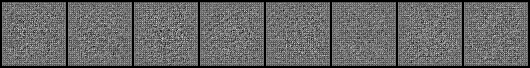

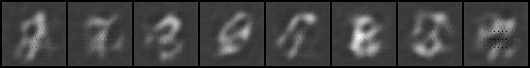

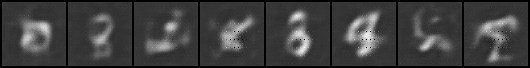

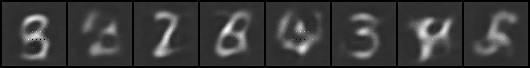

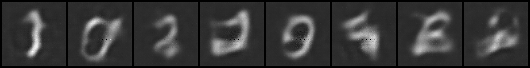

...

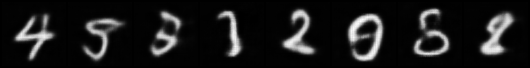

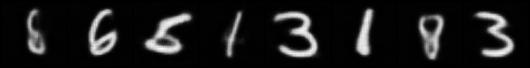

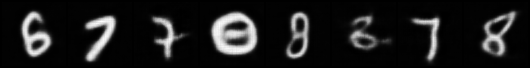

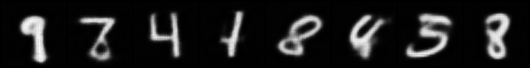

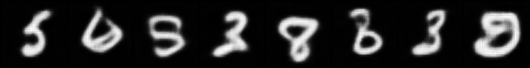

In [87]:
beta = 7.5
print(f"{beta=}")
vae = ConvVAE(100).cuda()
opt = torch.optim.Adam(vae.parameters(), lr=5e-4)
for epoch in range(100):
    for i, x in enumerate(loader):
        if len(x) == 2:
            x = x[0]
        x = x.cuda()

        mu, logvar, out = vae(x)
        rl, kl, l = loss(x, out, mu, logvar, beta)

        opt.zero_grad()
        l.backward()
        opt.step()
        if i == 0:
            vae.eval()
            data = vae.generate(8)
            grid_img = torchvision.utils.make_grid(data, nrow=8, normalize=True)
            show(grid_img)
            vae.train()

From the final trained VAE, lets generate some images -

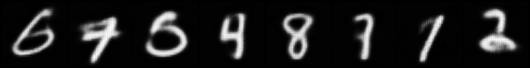

In [94]:
data = vae.generate(8)
grid_img = torchvision.utils.make_grid(data, nrow=8, normalize=True)
show(grid_img)

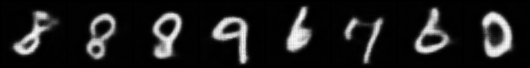

In [103]:
data = vae.generate(8)
grid_img = torchvision.utils.make_grid(data, nrow=8, normalize=True)
show(grid_img)

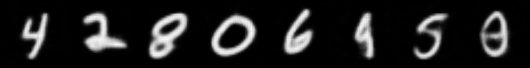

In [75]:
data = vae.generate(8)
grid_img = torchvision.utils.make_grid(data, nrow=8, normalize=True)
show(grid_img)

You'll also re-implement the Generator and Discriminator modules for the GAN, adopting a CNN-like architecture.

For the generator, implement a network similar to the one you used for the VAE decoder (fully connected for projection followed by 4 transposed convolutions), while for the discriminator you should use a network similar to the VAE encoder (4 conv layers with stride 2, but note that the output should be a scalar per image, not a latent vector).

In [88]:
class ConvGenerator(nn.Module):
    def __init__(self, latent_dim):
        super(ConvGenerator, self).__init__()
        self.latent_dim = latent_dim

        self.network = nn.Sequential(
            nn.Linear(self.latent_dim, 128*4*4),
            nn.Unflatten(1, (128, 4, 4)),
            nn.ConvTranspose2d(128,64,4,2,1),
            nn.BatchNorm2d(64),
            nn.ELU(),
            nn.ConvTranspose2d(64,32,4,2,1),
            nn.BatchNorm2d(32),
            nn.ELU(),
            nn.ConvTranspose2d(32,16,4,2,1),
            nn.BatchNorm2d(16),
            nn.ELU(),
            nn.ConvTranspose2d(16,1,4,2,1),
            nn.BatchNorm2d(1),
            nn.ELU()
        )

    def decode(self, input):
        out = self.network(input)
        return out

    def forward(self, n):
        z = torch.randn(n, self.latent_dim).cuda()
        samples = self.decode(z)
        return samples

In [89]:
class ConvDiscriminator(nn.Module):
    def __init__(self, latent_dim):
        super(ConvDiscriminator, self).__init__()

        self.network = nn.Sequential(
            nn.Conv2d(1,16,4,2,1),
            nn.BatchNorm2d(16),
            nn.ELU(),
            nn.Conv2d(16,32,4,2,1),
            nn.BatchNorm2d(32),
            nn.ELU(),
            nn.Conv2d(32,64,4,2,1),
            nn.BatchNorm2d(64),
            nn.ELU(),
            nn.Conv2d(64,128,4,2,1),
            nn.BatchNorm2d(128),
            nn.ELU(),
            nn.Flatten(),
            nn.Linear(128*4*4, 1)
        )

    def forward(self, input):
        out = self.network(input)
        return out

In [90]:
generator = ConvGenerator(100).cuda()
gopt = torch.optim.Adam(generator.parameters(), lr=5e-4, betas=(0.5, 0.999))
discriminator = ConvDiscriminator(100).cuda()
dopt = torch.optim.Adam(discriminator.parameters(), lr=5e-4, betas=(0.5, 0.999))
criterion = torch.nn.BCEWithLogitsLoss()

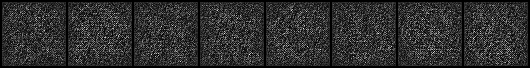

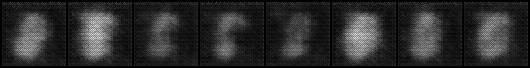

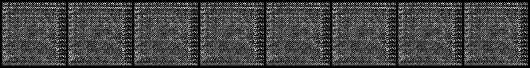

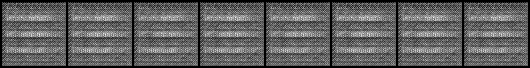

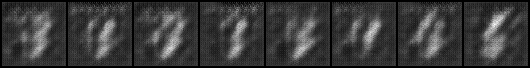

...

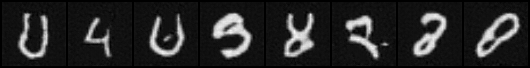

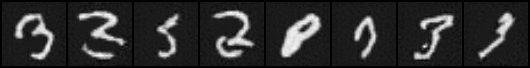

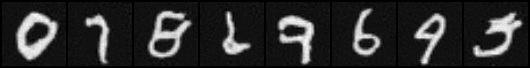

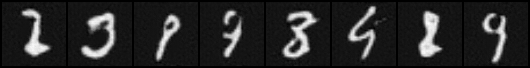

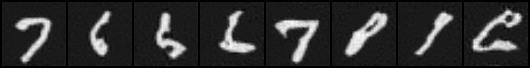

In [91]:
for epoch in range(100):
    # start = default_timer()
    for i, x in enumerate(loader):
        if len(x) == 2:
            x = x[0]
        x = x.cuda()
        batch_size = len(x)

        real_data = x

        gopt.zero_grad()
        dopt.zero_grad()

        fake_data = generator(batch_size)

        gloss = criterion(discriminator(fake_data), torch.ones(batch_size, 1).cuda())
        gloss.backward()
        gopt.step()

        dloss_real = criterion(discriminator(real_data), torch.ones(batch_size, 1).cuda())
        dloss_fake = criterion(discriminator(fake_data.detach()), torch.zeros(batch_size, 1).cuda())
        dloss = dloss_real + dloss_fake
        dloss.backward()
        dopt.step()

        if i == 0:
            grid_img = torchvision.utils.make_grid(fake_data[:8], nrow=8, normalize=True)
            show(grid_img)
    # print(epoch, default_timer()-start)

**<span style="color:blue">
    Compare and discuss the results you obtained with the VAE and with the GAN approach for this new dataset. Which of the two approaches was able to generate more realistic samples? Which of the two did you feel that you understood better (there is no correct answer here), and why? Mention one advantage and disadvantage of each of the two methods -- these should be precise properties about each approach, with a focus on what each method can and cannot do. Feel free to check papers, the original GAN paper might be especially helpful.
</span>**

**<span style="color:red">
    ------------------------------------------------------------------------------- ANSWER (BEGIN) -------------------------------------------------------------------------------
</span>**

The VAE, in my opinion, works better than the GAN. The GAN is quite finicky and not highly stable, whereas the VAE seems to understand the underlying representation better.

For the VAE, we are also able to read the digits better, and the ones that we are not able are primarily because those random inputs are in the latent space "in between" the numbers. For example, in the region where 1 turns to 7, so we sometimes cannot tell what's 1 and what's 7. The VAE is also slightly blurry, which follows from our discussion in class of using L2 regularisation.

The GAN is quite noisy, it starts off with more background noise than the VAE, and takes longer for the noise to disappear. The noise also keeps coming back periodically, which also makes me feel that the GAN can suddenly be overcome by noise (which could be a form of mode collapse). The GAN does have sharper images, but they seem to have sort of "texture" on them. The GAN also has an almost child-like feel to it, where it draws blobs, and tries to only draw ones accepted. As opposed to this, the VAE seems more stroke-like.

Advantage of VAE - VAEs work really well in cases where there is a reasonable underlying distribution that we can attempt to appraoch. VAEs tried to model the math behind the 3x3 circles more than circles that are next to each other. In cases where we need more precise mathematical qualities of the underlying distributions to be modelled enough for us to sample from, we can use VAEs.

Disadvantage of VAE - Lower quality outputs, which have a lot of blurriness, primarily due to the reconstruction loss equation used. We used L2 normalisation which is supposed to perform better but is still not sharp.

Advantage of GAN - GANs seem to be good options for really complex distributions where the underlying distribution is almost impossible to model. They rely on output that "looks right", which might not work great for simpler distributions (aka the 3x3 circles we tried earlier), but will work better for actual images of people/places.

Disadvantage of GAN - Higher likelihood of mode collapse, relies on "fooling" the discriminator, and as long as it matches even a subset of the inputs, it works fine. Here, it could collapse to a single number or "ambiguous" digits.


**<span style="color:red">
    ------------------------------------------------------------------------------- ANSWER (END) -------------------------------------------------------------------------------
</span>**